## Generate product similarity 

### Data

- Meta/Static features
- Text Description
- Images
- Computed Features from transactions (or interactions)

### Method

- FIASS
- HNSW: TODO
- Weaviate: TODO

### Evaluation

??

In [1]:
import sys
import gc
from pathlib import Path
import warnings

warnings.filterwarnings('ignore')

sys.path.append("../../")

from time import time
import pandas as pd
import numpy as np
from tqdm import tqdm

tqdm.pandas()

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

import lightning.pytorch as pl
from lightning.pytorch import callbacks as callbacks

from Data_pipelines import _read_data_files_helper as helper

pd.set_option("display.max_columns", 1000)
pd.set_option("display.max_rows", 10)

In [2]:
from _image_plot_helper import plot, plot_similar_items

In [35]:
from _text_parsing import cleanText, preptext

In [5]:
from sentence_transformers import SentenceTransformer

## Read files into Pandas DF

In [6]:
## transaction features generated for each product from `transactions_train.csv`
prod_tx_feat = pd.read_parquet(
   path_ / "train_article_tx_features.parquet"
)

prod_meta = helper.read_articles(path_)

prod_desc = prod_meta.filter(["article_id", "detail_desc"])
prod_desc.dropna(inplace=True)

prod_meta = prod_meta.drop(columns=["detail_desc"])

## Generate text embeddings via Sentence Transformer

In [ ]:
model = SentenceTransformer('sentence-transformers/all-MiniLM-L12-v2')

In [ ]:
cleaned_prod_desc = preptext(prod_desc)
assert cleaned_prod_desc.isna().sum().sum() == 0

In [ ]:
cleaned_prod_desc.head(2)

In [ ]:
## max length of tokens ina sentence is 77
# cleaned_prod_desc.cleaned_desc.apply(lambda x: len(x)).max()

In [ ]:
%%time 

cleaned_prod_desc = cleaned_prod_desc.sort_values(by='article_id')

##runs on GPU
txt_embeddings = model.encode(cleaned_prod_desc.cleaned_desc.values)

In [ ]:
txt_emb_dict = {}
for i, row in tqdm(enumerate(cleaned_prod_desc.itertuples())):
    txt_emb_dict.update({str(row.article_id): txt_embeddings[i]})

np.savez(path_ / "prod_txt_embeddings", **txt_emb_dict)

txt_emb_dict.clear()

## Save Static features Embeddings

In [ ]:
from prod_categorical_embeddings import StaticFeaturesDataModule, TextEmbeddings

In [ ]:
dm = StaticFeaturesDataModule(
    path_processed_data.parent, {}, None, False
)

embedding_shape, nclasses = dm.get_embedding_shape(8)

In [ ]:
model_ = TextEmbeddings(
    embedding_shape,
    nclasses,
    None,
    None,
    None,
    "val_loss",
    None,
    "max",
    )

model_.load_state_dict(
    torch.load(path_ / "model_cat_feat_embeddings_class.pt")
)

In [ ]:
dm.input_cols.shape, len(model_.all_embeddings)

In [ ]:
def get_embeddings(x, emb_model):
    """ """
    all_cat_emb = []
    for idx, layer in enumerate(emb_model.all_embeddings):
        all_cat_emb.append(layer(torch.as_tensor([x[idx]])).detach().numpy())
    
    output = np.asarray(all_cat_emb).flatten().reshape(1,-1)
    all_cat_emb.clear()
    
    return output

In [ ]:
model_input = dm.product_features.filter(dm.input_cols)

In [ ]:
categorical_embeddings={}

for index, series in tqdm(model_input.iterrows()):
    categorical_embeddings.update({str(index): get_embeddings(series.to_numpy(), model_)})


np.savez(path_  / "prod_cat_embeddings", **categorical_embeddings)

## Normalise transaction Features

In [ ]:
from sklearn.preprocessing import normalize

In [ ]:
tx_embeddings = {}

norm_prod_tx_feat = pd.DataFrame(normalize(prod_tx_feat, axis=0), index=prod_tx_feat.index)

for index, series in tqdm(norm_prod_tx_feat.iterrows()):
    tx_embeddings.update({str(index): series.to_numpy()})


np.savez(path_ / "prod_tx_embeddings", **tx_embeddings)

## Compute Similarity

### Load image data for visual insepction

In [27]:
image_path = path_ / 'images'
lookup_path = path_

pd_image_df = helper.findAllFiles(image_path, plot=False).astype(
    {"article_id": "int32"}
)

## lookup reindex product ids from 0 to n-1 for n products
df_lookup = pd.read_csv(lookup_path / "lookup_table_products.csv").astype(
    "int32"
)

image_df = (
    pd_image_df.merge(df_lookup, on="article_id")
    .drop(columns=["article_id"])
    .rename(columns={"_article_id": "article_id"})
    .astype({"article_id": 'int32'})
)

image_df.set_index(['article_id'], inplace=True)

### FIASS

In [6]:
import faiss

### L2 indexing

In [56]:
def run_example(path_, image_df, k):
    articles_ids, _embeddings = get_embeddings(path_)
    # build index and run random query
    embedding_length = _embeddings.shape[1] 
    ## select a random index
    query = _embeddings[np.random.choice(_embeddings.shape[0], size=1)[0]].reshape(1, -1)
    
    index = faiss.IndexFlatL2(embedding_length)
    index.add(_embeddings)
    
    distance, _index = index.search(query, k)  # search
    plot_similar_items(image_df, _index)

#### THE FIRST IMAGE IS THE QUERY IMAGE ####

- Text embeddings are generated from the product description 
- Image embeddings are generated via fine tuning a pre trained model (performance can be imporved with better base models and using more computation on fine tuning)
- Categorical embeddings are generated by training the model towards predicting `garment_group_name`. (a sentence embeddinging generator would suffice as shown in other notebook)
- Transaction embeddings generated by creating features based on product purchase. (Doesn't have much relevance but used it to see how the similarity would look)

In [1]:
files = ["prod_txt_embeddings_.parquet", "prod_img_embeddings_.parquet",
        "prod_cat_embeddings_.parquet", "prod_tx_embeddings_.parquet"]

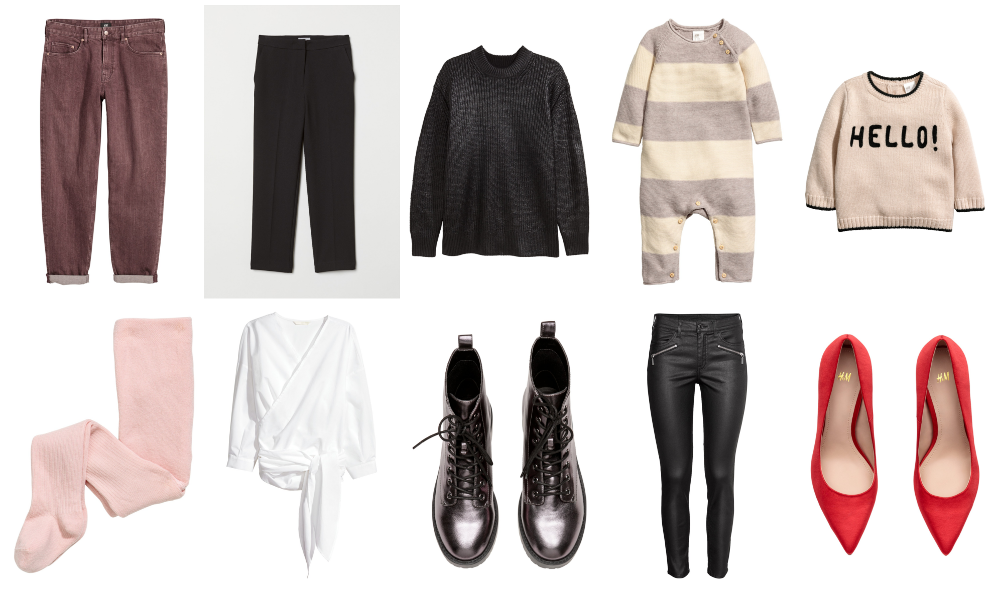

In [58]:
# TEXT EMBEDDINGS
run_example(path_processed_data / files[0], image_df, 10)

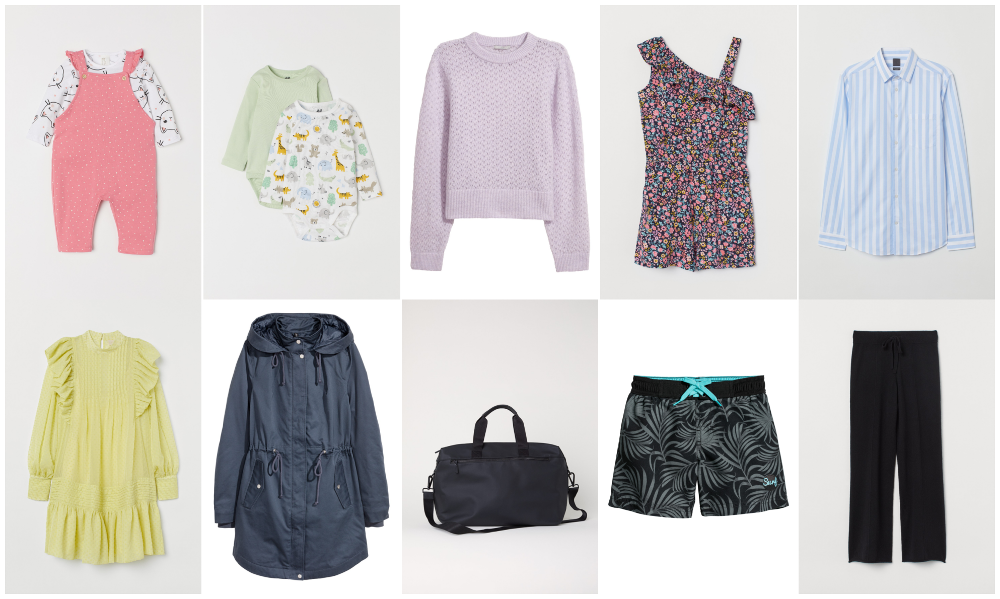

In [77]:
# IMAGE EMBEDDINGS
run_example(path_processed_data / files[1], image_df, 10)

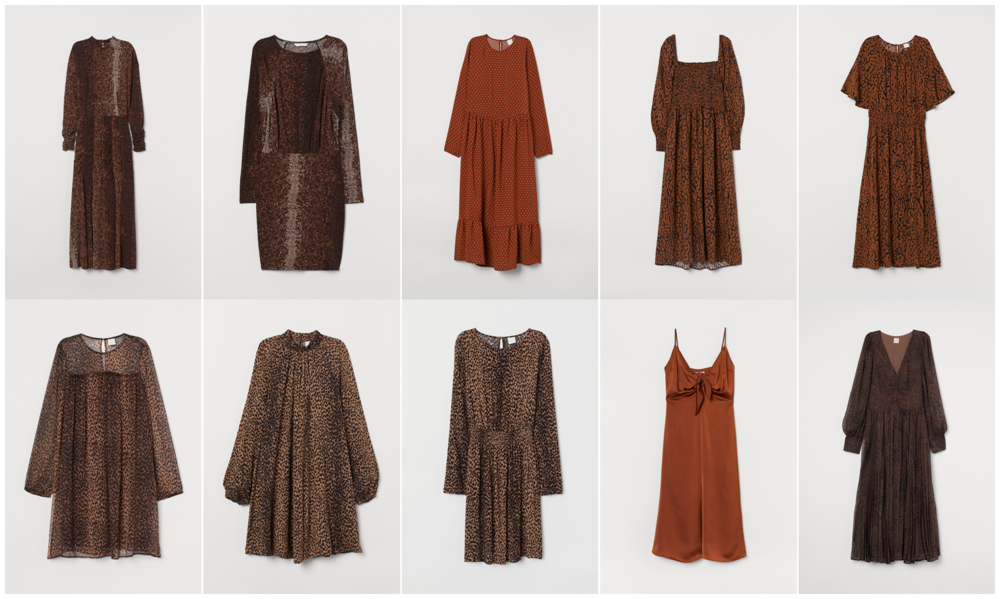

In [68]:
# Categorical data EMBEDDINGS
run_example(path_processed_data / files[2], image_df, 10)

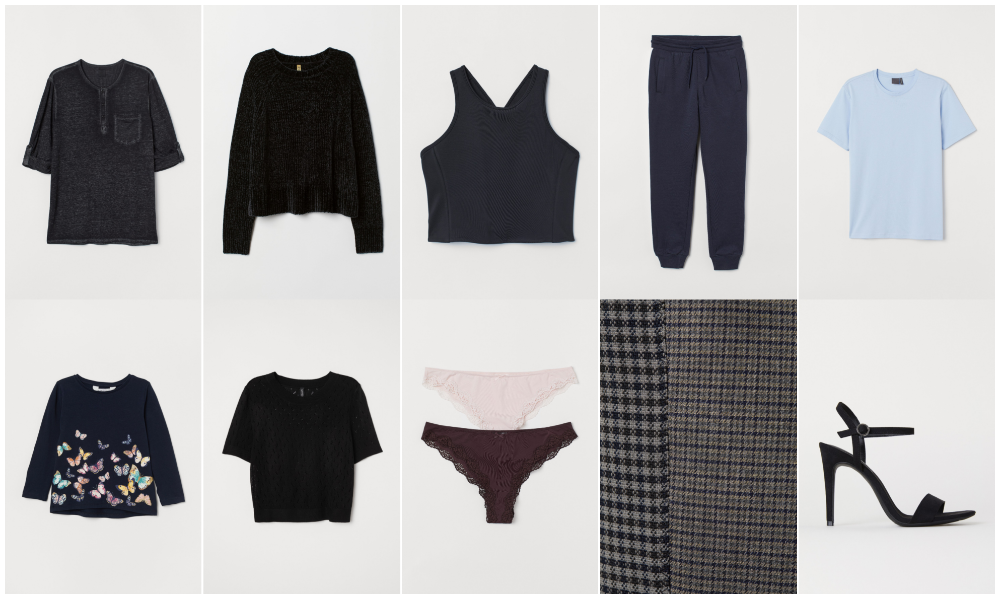

In [69]:
# TRANSACTIONAL EMBEDDINGS
run_example(path_processed_data / files[3], image_df, 10)

### Test FlatL2 Speed

In [16]:
articles_ids, _embeddings = get_embeddings(path_processed_data/files[1])
# build index and run random query
embedding_length = _embeddings.shape[1] 

index = faiss.IndexFlatL2(embedding_length)
index.add(_embeddings)

In [ ]:
%%time
for item in tqdm(range(_embeddings.shape[0])):
    distance, _index = index.search(_embeddings[item].reshape(1, -1), 10)

In [24]:
(1/80*1000) #miliseconds

12.5

### Index partitioning 

In [10]:
articles_ids, _embeddings = get_embeddings(path_processed_data / files[1])

In [11]:
nlist = 50  # how many cells
quantizer = faiss.IndexFlatL2(_embeddings.shape[1])
index = faiss.IndexIVFFlat(quantizer, _embeddings.shape[1], nlist)

In [14]:
index.is_trained

True

In [13]:
index.train(_embeddings)

In [19]:
index.add(_embeddings)

In [20]:
index.ntotal

105100

In [32]:
query = _embeddings[np.random.choice(_embeddings.shape[0], size=1)[0]].reshape(1, -1)

In [33]:
%%time
distance, _index = index.search(query, 10) 

CPU times: user 1.15 ms, sys: 396 µs, total: 1.55 ms
Wall time: 694 µs


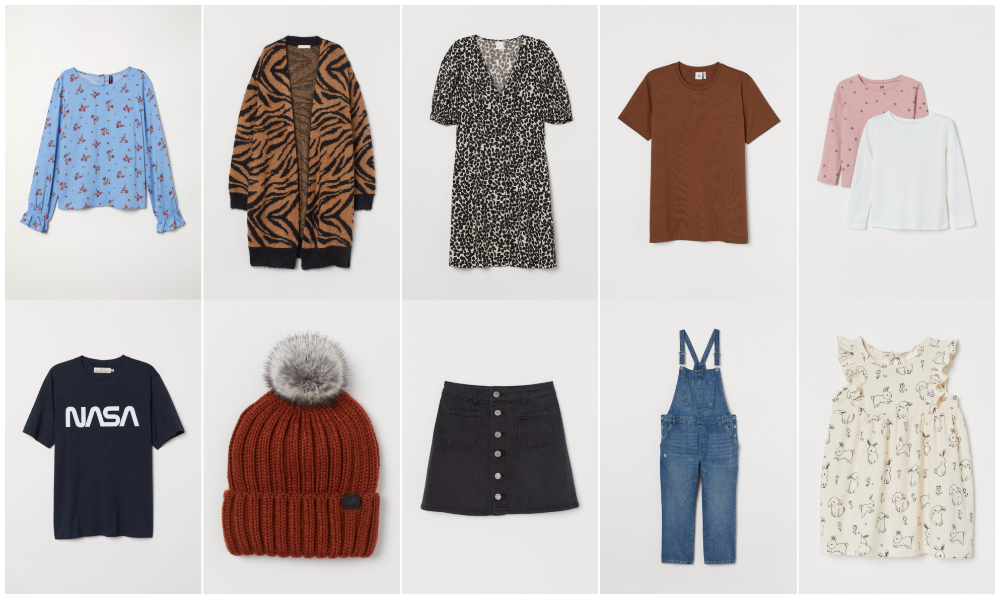

In [34]:
## based on product description
plot_similar_items(image_df, _index)